In [2]:
import pandas as pd
from datetime import date
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.preprocessing import MinMaxScaler
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout,LSTM,Activation,RepeatVector
from feature_engine.timeseries.forecasting import LagFeatures, WindowFeatures, ExpandingWindowFeatures
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import grangercausalitytests, adfuller
from tqdm import tqdm_notebook
from itertools import product

import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv('m-hsoldhst6312.txt', sep=' ')

In [4]:
df.head()

,year,mon,hsold,hstart
0,1963,1,42,79.0
1,1963,2,35,89.6
2,1963,3,44,124.8
3,1963,4,52,164.2
4,1963,5,58,172.7


In [5]:
df['Date'] = df['year'].astype(str)+' /'+df['mon'].astype(str)

In [6]:
df_new = df[['Date', 'hsold','hstart']]
df_new

,Date,hsold,hstart
0,1963 /1,42,79.0
1,1963 /2,35,89.6
2,1963 /3,44,124.8
3,1963 /4,52,164.2
4,1963 /5,58,172.7
...,...,...,...
590,2012 /3,34,58.0
591,2012 /4,34,66.8
592,2012 /5,35,67.8
593,2012 /6,34,74.7


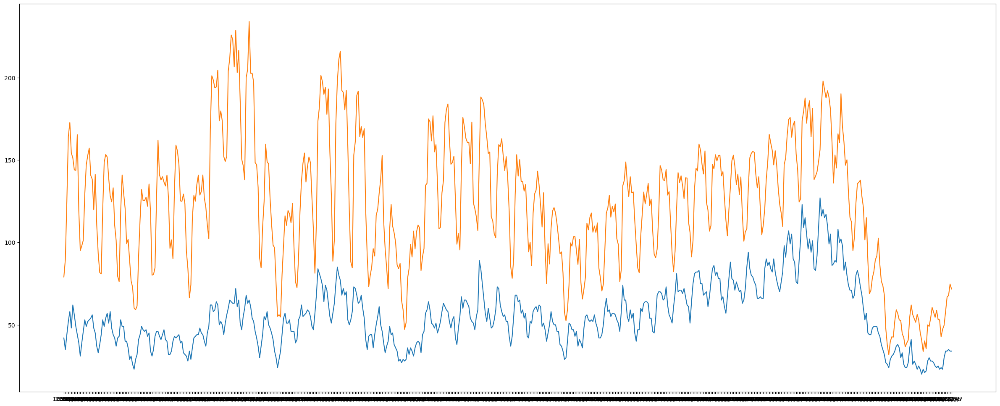

In [7]:
plt.figure(figsize=(30,12))
plt.plot(df_new['Date'],df_new['hsold'],label='hsold')
plt.plot(df_new['Date'],df_new['hstart'],label='hstart')
plt.rcParams["font.size"]="10"

In [8]:
df_new['Date'] = pd.to_datetime(df_new['Date'])
df_new['Date']

C:\Users\User\AppData\Local\Temp\ipykernel_14772\35616042.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['Date'] = pd.to_datetime(df_new['Date'])


0     1963-01-01
1     1963-02-01
2     1963-03-01
3     1963-04-01
4     1963-05-01
         ...    
590   2012-03-01
591   2012-04-01
592   2012-05-01
593   2012-06-01
594   2012-07-01
Name: Date, Length: 595, dtype: datetime64[ns]

In [9]:
df_ = df_new.copy()
df_

,Date,hsold,hstart
0,1963-01-01,42,79.0
1,1963-02-01,35,89.6
2,1963-03-01,44,124.8
3,1963-04-01,52,164.2
4,1963-05-01,58,172.7
...,...,...,...
590,2012-03-01,34,58.0
591,2012-04-01,34,66.8
592,2012-05-01,35,67.8
593,2012-06-01,34,74.7


In [10]:
#Date Time Features
df_['year']  = df_['Date'].dt.year
df_['month']  = df_['Date'].dt.month

In [11]:
#Lag features
df_[f"hsold_lag_1"] = df_["hsold"].shift(periods=1)
df_[f"hsold_lag_2"] = df_["hsold"].shift(periods=2)
df_[f"hsold_lag_3"] = df_["hsold"].shift(periods=3)
df_[f"hsold_lag_4"] = df_["hsold"].shift(periods=4)
df_[f"hsold_lag_5"] = df_["hsold"].shift(periods=5)
df_[f"hsold_lag_6"] = df_["hsold"].shift(periods=6)
df_[f"hsold_lag_7"] = df_["hsold"].shift(periods=7)
df_[f"hsold_lag_8"] = df_["hsold"].shift(periods=8)
df_[f"hsold_lag_12"] = df_["hsold"].shift(periods=12)
df_[f"hsold_lag_14"] = df_["hsold"].shift(periods=14)
df_[f"hsold_lag_16"] = df_["hsold"].shift(periods=16)
df_[f"hsold_lag_18"] = df_["hsold"].shift(periods=18)
df_[f"hsold_lag_20"] = df_["hsold"].shift(periods=20)
df_[f"hsold_lag_22"] = df_["hsold"].shift(periods=22)
df_[f"hsold_lag_24"] = df_["hsold"].shift(periods=24)
df_[f"hsold_lag_28"] = df_["hsold"].shift(periods=28)
df_[f"hsold_lag_30"] = df_["hsold"].shift(periods=30)


In [12]:
#Lag features
df_[f"hstart_lag_1"] = df_["hstart"].shift(periods=1)
df_[f"hstart_lag_2"] = df_["hstart"].shift(periods=2)
df_[f"hstart_lag_3"] = df_["hstart"].shift(periods=3)
df_[f"hstart_lag_4"] = df_["hstart"].shift(periods=4)
df_[f"hstart_lag_5"] = df_["hstart"].shift(periods=5)
df_[f"hstart_lag_6"] = df_["hstart"].shift(periods=6)
df_[f"hstart_lag_7"] = df_["hstart"].shift(periods=7)
df_[f"hstart_lag_8"] = df_["hstart"].shift(periods=8)
df_[f"hstart_lag_12"] = df_["hstart"].shift(periods=12)
df_[f"hstart_lag_14"] = df_["hstart"].shift(periods=14)
df_[f"hstart_lag_16"] = df_["hstart"].shift(periods=16)
df_[f"hstart_lag_18"] = df_["hstart"].shift(periods=18)
df_[f"hstart_lag_20"] = df_["hstart"].shift(periods=20)
df_[f"hstart_lag_22"] = df_["hstart"].shift(periods=22)
df_[f"hstart_lag_24"] = df_["hstart"].shift(periods=24)
df_[f"hstart_lag_28"] = df_["hstart"].shift(periods=28)
df_[f"hstart_lag_30"] = df_["hstart"].shift(periods=30)


In [13]:
#Rolling window feature
df_['rolling_mean_hsold_7'] = df_['hsold'].rolling(window=7).mean()
df_['rolling_mean_hsold_12'] = df_['hsold'].rolling(window=12).mean()
df_['rolling_mean_hsold_16'] = df_['hsold'].rolling(window=16).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=20).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=24).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=28).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=32).mean()
df_['rolling_mean_hsold_40'] = df_['hsold'].rolling(window=40).mean()
df_['rolling_mean_hsold_80'] = df_['hsold'].rolling(window=80).mean()
df_['rolling_mean_hsold_100'] = df_['hsold'].rolling(window=100).mean()
df_['rolling_mean_hsold_200'] = df_['hsold'].rolling(window=200).mean()

In [14]:
df_['rolling_mean_hstart_7'] = df_['hstart'].rolling(window=7).mean()
df_['rolling_mean_hstart_12'] = df_['hstart'].rolling(window=12).mean()
df_['rolling_mean_hstart_16'] = df_['hstart'].rolling(window=16).mean()
df_['rolling_mean_hstart_20'] = df_['hstart'].rolling(window=20).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=24).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=28).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=32).mean()
df_['rolling_mean_hstart_40'] = df_['hstart'].rolling(window=40).mean()
df_['rolling_mean_hstart_80'] = df_['hstart'].rolling(window=80).mean()
df_['rolling_mean_hstart_100'] = df_['hstart'].rolling(window=100).mean()
df_['rolling_mean_hstart_200'] = df_['hstart'].rolling(window=200).mean()

In [15]:
#Expanding Window feature
df_['expanding_mean_hstart_7'] = df_['hstart'].expanding(7).mean()
df_['expanding_mean_hstart_12'] = df_['hstart'].expanding(12).mean()
df_['expanding_mean_hstart_16'] = df_['hstart'].expanding(16).mean()
df_['expanding_mean_hstart_20'] = df_['hstart'].expanding(20).mean()
df_['expanding_mean_hstart_24'] = df_['hstart'].expanding(24).mean()
df_['expanding_mean_hstart_28'] = df_['hstart'].expanding(28).mean()
df_['expanding_mean_hstart_40'] = df_['hstart'].expanding(40).mean()
df_['expanding_mean_hstart_80'] = df_['hstart'].expanding(80).mean()
df_['expanding_mean_hstart_100'] = df_['hstart'].expanding(100).mean()
df_['expanding_mean_hstart_200'] = df_['hstart'].expanding(200).mean()

In [16]:
#Expanding Window feature
df_['expanding_mean_hsold_7'] = df_['hsold'].expanding(7).mean()
df_['expanding_mean_hsold_12'] = df_['hsold'].expanding(12).mean()
df_['expanding_mean_hsold_16'] = df_['hsold'].expanding(16).mean()
df_['expanding_mean_hsold_20'] = df_['hsold'].expanding(20).mean()
df_['expanding_mean_hsold_24'] = df_['hsold'].expanding(24).mean()
df_['expanding_mean_hsold_28'] = df_['hsold'].expanding(28).mean()
df_['expanding_mean_hsold_40'] = df_['hsold'].expanding(40).mean()
df_['expanding_mean_hsold_80'] = df_['hsold'].expanding(80).mean()
df_['expanding_mean_hsold_100'] = df_['hsold'].expanding(100).mean()
df_['expanding_mean_hsold_200'] = df_['hsold'].expanding(200).mean()

In [16]:
#Remove seasonality using differencing
#df_['hsold_diff_1'] = df_['hsold'] - df_["hsold"].shift(periods=1)
#df_['hsold_diff_2'] = df_['hsold'] - df_["hsold"].shift(periods=2)
#df_['hsold_diff_3'] = df_['hsold'] - df_["hsold"].shift(periods=3)
#df_['hsold_diff_4'] = df_['hsold'] - df_["hsold"].shift(periods=4)
#df_['hsold_diff_7'] = df_['hsold'] - df_["hsold"].shift(periods=7)
#df_['hsold_diff_12'] = df_['hsold'] - df_["hsold"].shift(periods=12)


#df_['hstart_diff_1'] = df_['hstart'] - df_["hstart"].shift(periods=1)
#df_['hstart_diff_2'] = df_['hstart'] - df_["hstart"].shift(periods=2)
#df_['hstart_diff_3'] = df_['hstart'] - df_["hstart"].shift(periods=3)
#df_['hstart_diff_4'] = df_['hstart'] - df_["hstart"].shift(periods=4)
#df_['hstart_diff_7'] = df_['hstart'] - df_["hstart"].shift(periods=7)
#df_['hstart_diff_12'] = df_['hstart'] - df_["hstart"].shift(periods=12)



In [17]:
df_

,Date,hsold,hstart,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,...,expanding_mean_hsold_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20,expanding_mean_hsold_24,expanding_mean_hsold_28,expanding_mean_hsold_40,expanding_mean_hsold_80,expanding_mean_hsold_100,expanding_mean_hsold_200
0,1963-01-01,42,79.0,1963,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1963-02-01,35,89.6,1963,2,42.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1963-03-01,44,124.8,1963,3,35.0,42.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1963-04-01,52,164.2,1963,4,44.0,35.0,42.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1963-05-01,58,172.7,1963,5,52.0,44.0,35.0,42.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,2012-03-01,34,58.0,2012,3,30.0,23.0,24.0,23.0,25.0,...,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193
591,2012-04-01,34,66.8,2012,4,34.0,30.0,23.0,24.0,23.0,...,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459
592,2012-05-01,35,67.8,2012,5,34.0,34.0,30.0,23.0,24.0,...,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536
593,2012-06-01,34,74.7,2012,6,35.0,34.0,34.0,30.0,23.0,...,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047


In [18]:
df = df_.fillna(0)

# Random Forest

In [19]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [20]:
X

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,expanding_mean_hsold_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20,expanding_mean_hsold_24,expanding_mean_hsold_28,expanding_mean_hsold_40,expanding_mean_hsold_80,expanding_mean_hsold_100,expanding_mean_hsold_200
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,2012,3,30.0,23.0,24.0,23.0,25.0,24.0,25.0,27.0,...,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193,55.746193
591,2012,4,34.0,30.0,23.0,24.0,23.0,25.0,24.0,25.0,...,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459,55.709459
592,2012,5,34.0,34.0,30.0,23.0,24.0,23.0,25.0,24.0,...,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536,55.674536
593,2012,6,35.0,34.0,34.0,30.0,23.0,24.0,23.0,25.0,...,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047,55.638047


In [21]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]

In [22]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]

In [23]:
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,expanding_mean_hsold_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20,expanding_mean_hsold_24,expanding_mean_hsold_28,expanding_mean_hsold_40,expanding_mean_hsold_80,expanding_mean_hsold_100,expanding_mean_hsold_200
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526


In [24]:
model_rf = RandomForestClassifier()

In [25]:
#fit the model
model_rf.fit(train_data_x,train_data_y)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.01680672268907563


In [26]:
model_rf.feature_importances_

array([0.00618453, 0.01395099, 0.03145975, 0.02228319, 0.01655261,
       0.01534537, 0.01476228, 0.0169968 , 0.01533173, 0.01660297,
       0.02386731, 0.01500582, 0.01445272, 0.01480482, 0.0140894 ,
       0.01520724, 0.01580848, 0.01460552, 0.01334438, 0.01806596,
       0.01836615, 0.01637959, 0.01743499, 0.01900463, 0.01410887,
       0.01711596, 0.0157433 , 0.01537387, 0.01602352, 0.01515595,
       0.01584117, 0.01494393, 0.01704396, 0.01618505, 0.01673258,
       0.01766594, 0.01961472, 0.01720424, 0.01470429, 0.00943443,
       0.012778  , 0.01107827, 0.01074835, 0.00708469, 0.01426215,
       0.01600445, 0.01349843, 0.01216863, 0.01122441, 0.01172447,
       0.01138205, 0.01065644, 0.0098878 , 0.01094161, 0.01115185,
       0.01068786, 0.00917382, 0.00918788, 0.0091108 , 0.01090753,
       0.00926075, 0.00826718, 0.00793899, 0.01083006, 0.01030718,
       0.01124329, 0.01033022, 0.01200766, 0.01017702, 0.00980263,
       0.00874206, 0.00840383, 0.00623063])

In [27]:
model_rf.feature_names_in_


array(['year', 'month', 'hsold_lag_1', 'hsold_lag_2', 'hsold_lag_3',
       'hsold_lag_4', 'hsold_lag_5', 'hsold_lag_6', 'hsold_lag_7',
       'hsold_lag_8', 'hsold_lag_12', 'hsold_lag_14', 'hsold_lag_16',
       'hsold_lag_18', 'hsold_lag_20', 'hsold_lag_22', 'hsold_lag_24',
       'hsold_lag_28', 'hsold_lag_30', 'hstart_lag_1', 'hstart_lag_2',
       'hstart_lag_3', 'hstart_lag_4', 'hstart_lag_5', 'hstart_lag_6',
       'hstart_lag_7', 'hstart_lag_8', 'hstart_lag_12', 'hstart_lag_14',
       'hstart_lag_16', 'hstart_lag_18', 'hstart_lag_20', 'hstart_lag_22',
       'hstart_lag_24', 'hstart_lag_28', 'hstart_lag_30',
       'rolling_mean_hsold_7', 'rolling_mean_hsold_12',
       'rolling_mean_hsold_16', 'rolling_mean_hsold_20',
       'rolling_mean_hsold_40', 'rolling_mean_hsold_80',
       'rolling_mean_hsold_100', 'rolling_mean_hsold_200',
       'rolling_mean_hstart_7', 'rolling_mean_hstart_12',
       'rolling_mean_hstart_16', 'rolling_mean_hstart_20',
       'rolling_mean_hstart_2

<BarContainer object of 73 artists>

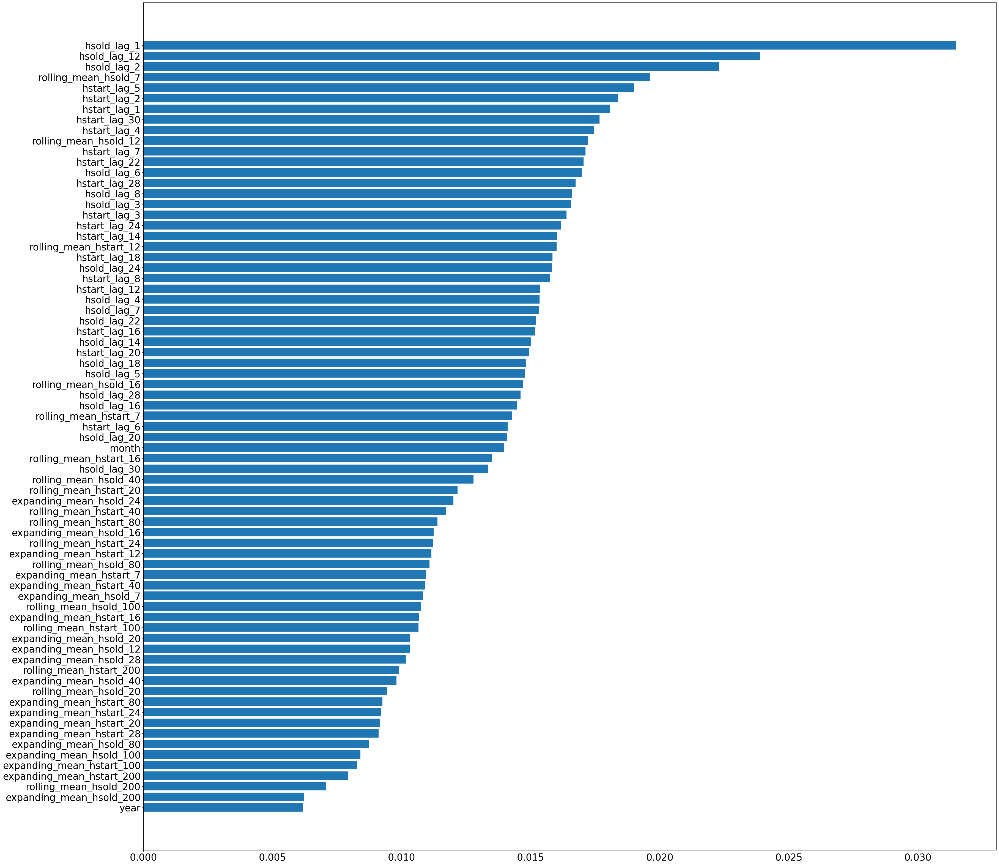

In [28]:
importances_df = pd.DataFrame({"feature_names" : model_rf.feature_names_in_, 
                               "importances" : model_rf.feature_importances_})

importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])
#g.set_title("Feature importances", fontsize=25);                          


# RandomForest hstart data

In [29]:
#Splitting data into x,y
y_hstart = df["hstart"].astype(int)

X_hstart =df.drop(["Date","hsold","hstart"],axis=1)

In [30]:
train_size = int(len(X_hstart)*0.8)
test_size_x = len(X_hstart) - train_size
train_data_x_hstart = X_hstart[:train_size]
test_data_x_hstart =  X_hstart[train_size:]

In [31]:
train_size = int(len(y_hstart)*0.8)
test_size_y = len(y_hstart) - train_size
train_data_y_hstart = y_hstart[:train_size]
test_data_y_hstart =  y_hstart[train_size:]
train_data_y_hstart

0       79
1       89
2      124
3      164
4      172
      ... 
471    148
472    165
473    160
474    155
475    147
Name: hstart, Length: 476, dtype: int32

In [32]:
model_rf_hstart = RandomForestClassifier()


In [33]:
model_rf_hstart.fit(train_data_x_hstart,train_data_y_hstart)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)


0.0


<BarContainer object of 73 artists>

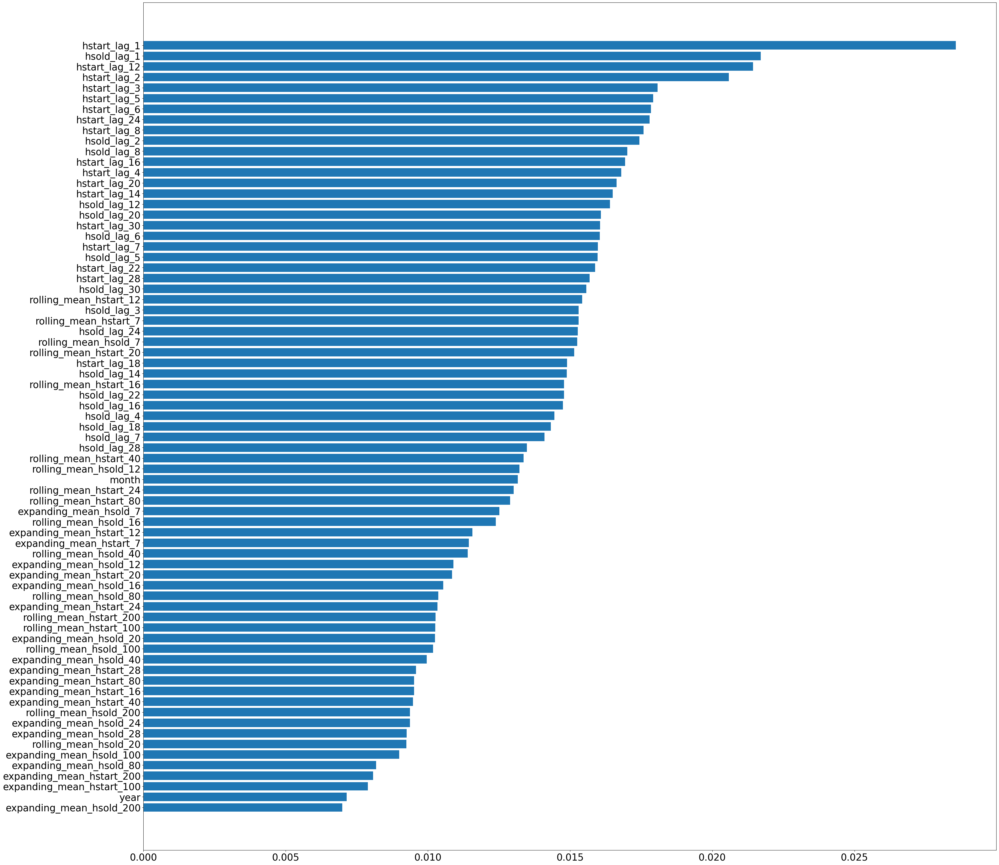

In [34]:
importances_df = pd.DataFrame({"feature_names" : model_rf_hstart.feature_names_in_, 
                               "importances" : model_rf_hstart.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                  
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

In [43]:
#Correlation
cor = df.corr()
top_corr_features = cor.index
plt.figure(figsize=(100,100))
g = sb.heatmap(df_[top_corr_features].corr(),annot=True,)

C:\Users\User\AppData\Local\Temp\ipykernel_20320\1298823419.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


# XGB classifier

In [35]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [36]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,expanding_mean_hsold_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20,expanding_mean_hsold_24,expanding_mean_hsold_28,expanding_mean_hsold_40,expanding_mean_hsold_80,expanding_mean_hsold_100,expanding_mean_hsold_200
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526


In [37]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      42
1      35
2      44
3      52
4      58
       ..
471    86
472    88
473    84
474    82
475    90
Name: hsold, Length: 476, dtype: int64

In [38]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y = le.fit_transform(train_data_y)
test_data_y = le.fit_transform(test_data_y)
train_data_y.shape

(476,)

In [39]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x,train_data_y)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [40]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.03361344537815126


<BarContainer object of 73 artists>

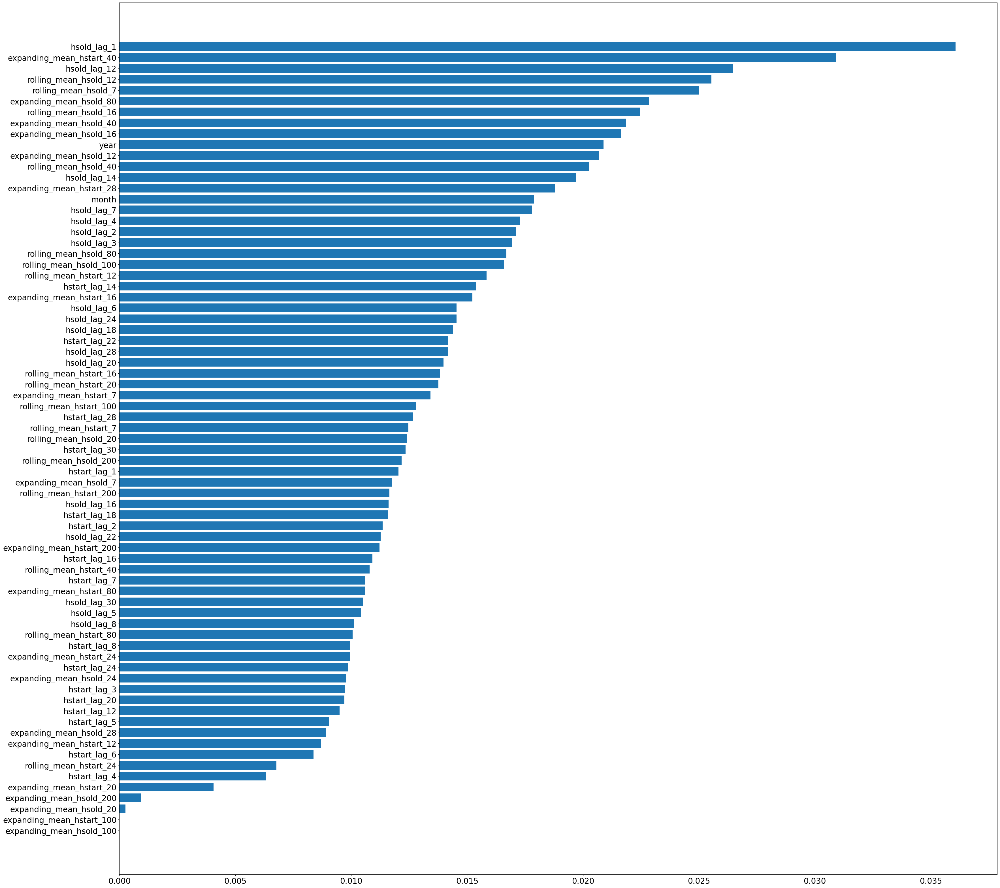

In [41]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   
                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# XGB For hstart

In [42]:
#Splitting data into x,y
y =df["hstart"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [43]:
train_size = int(len(X)*0.8)
test_size = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,expanding_mean_hsold_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20,expanding_mean_hsold_24,expanding_mean_hsold_28,expanding_mean_hsold_40,expanding_mean_hsold_80,expanding_mean_hsold_100,expanding_mean_hsold_200
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526


In [44]:
train_size = int(len(y)*0.8)
test_size = len(y) - train_size
train_data_y_hstart = y[:train_size]
test_data_y_hstart =  y[train_size:]
train_data_y_hstart

0       79.0
1       89.6
2      124.8
3      164.2
4      172.7
       ...  
471    148.8
472    165.5
473    160.3
474    155.9
475    147.0
Name: hstart, Length: 476, dtype: float64

In [45]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y_hstart = le.fit_transform(train_data_y_hstart)
train_data_y_hstart.shape
test_data_y_hstart = le.fit_transform(test_data_y_hstart)

In [46]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x_hstart,train_data_y_hstart)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [47]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)

0.0


<BarContainer object of 73 artists>

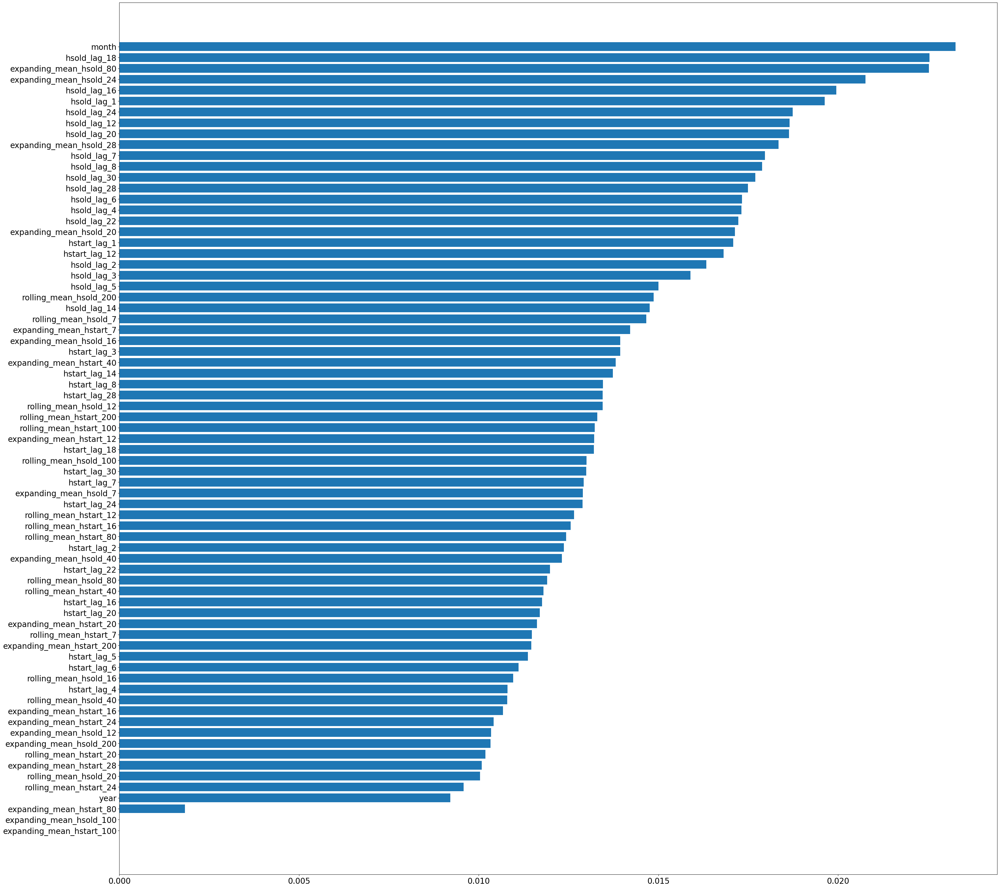

In [48]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   

# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree classifier

In [49]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [50]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,expanding_mean_hsold_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20,expanding_mean_hsold_24,expanding_mean_hsold_28,expanding_mean_hsold_40,expanding_mean_hsold_80,expanding_mean_hsold_100,expanding_mean_hsold_200
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526


In [51]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      42
1      35
2      44
3      52
4      58
       ..
471    86
472    88
473    84
474    82
475    90
Name: hsold, Length: 476, dtype: int64

In [52]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x,train_data_y)

DecisionTreeClassifier()

In [53]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.10084033613445378


<BarContainer object of 73 artists>

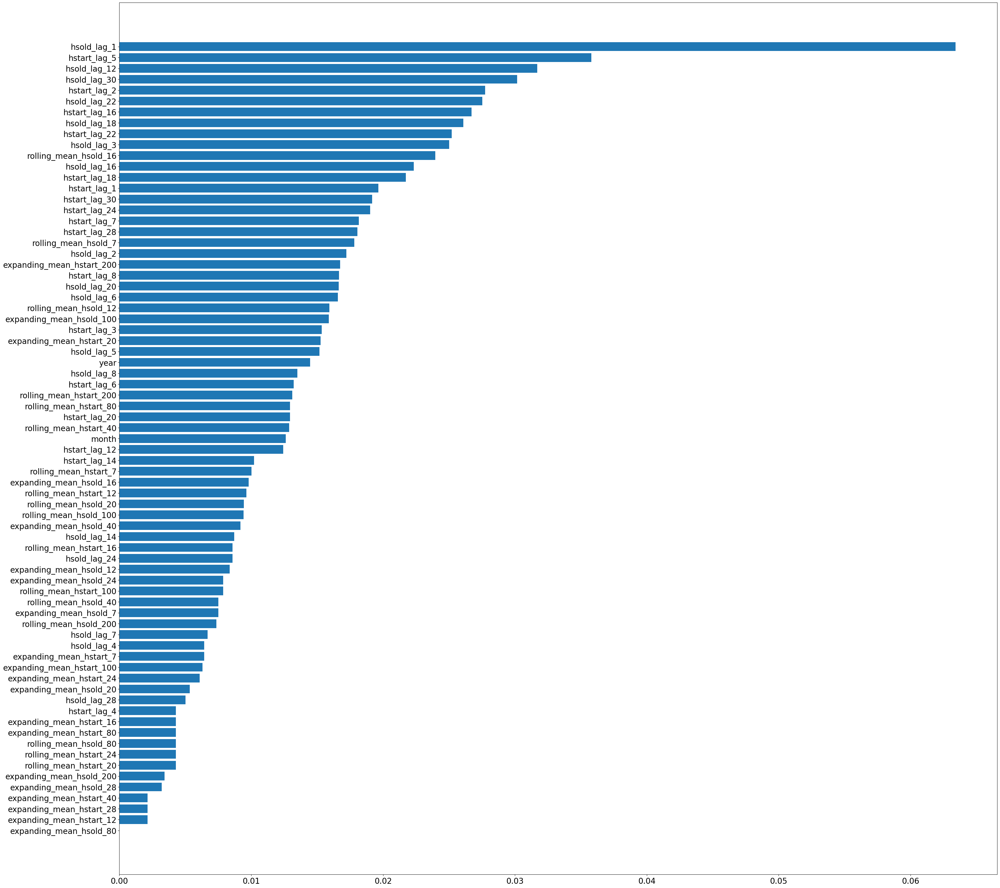

In [54]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)              
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree hstart

In [55]:
#Splitting data into x,y
y =df["hstart"].astype(int)
X =df.drop(["Date","hsold","hstart"],axis=1)

In [56]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,expanding_mean_hsold_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20,expanding_mean_hsold_24,expanding_mean_hsold_28,expanding_mean_hsold_40,expanding_mean_hsold_80,expanding_mean_hsold_100,expanding_mean_hsold_200
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661,53.654661
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273,53.727273
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139,53.791139
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526,53.850526


In [57]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y_hstart = y[:train_size]
test_data_y_hstart =  y[train_size:]
train_data_y_hstart

0       79
1       89
2      124
3      164
4      172
      ... 
471    148
472    165
473    160
474    155
475    147
Name: hstart, Length: 476, dtype: int32

In [58]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x_hstart,train_data_y_hstart)

DecisionTreeClassifier()

In [59]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)

0.01680672268907563


<BarContainer object of 73 artists>

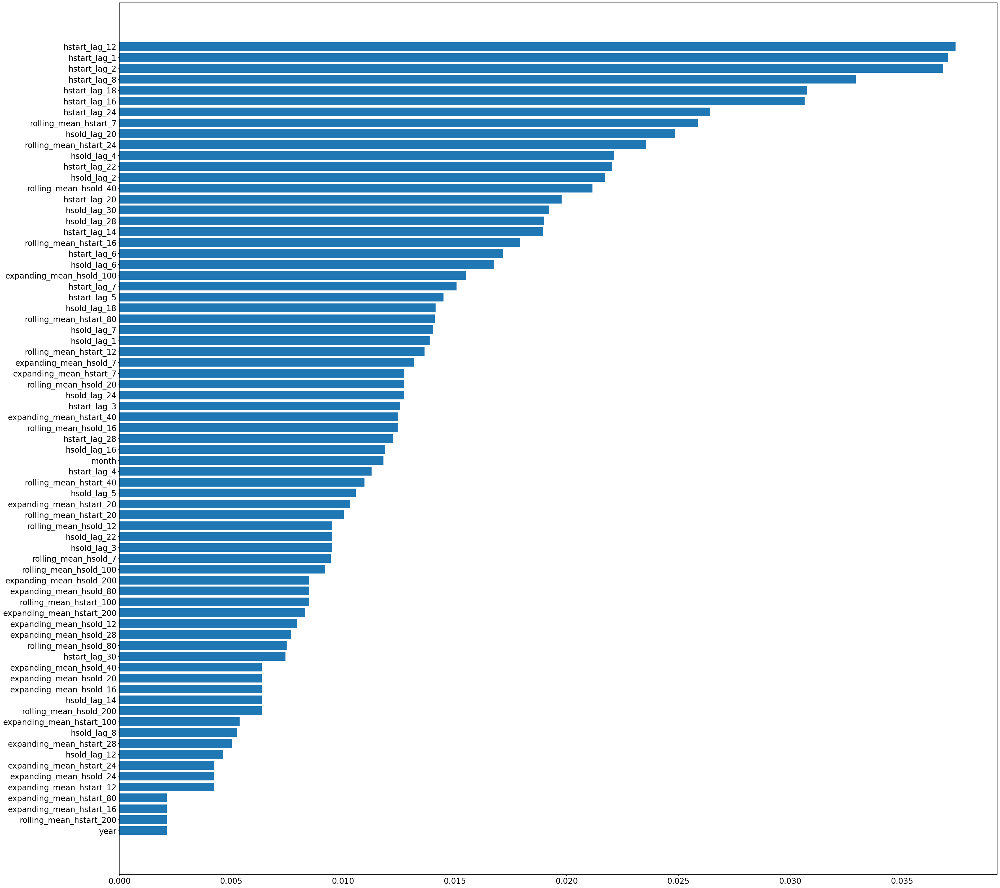

In [60]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# VAR 3 top features

In [21]:
#Data set for 
data_set_1 = df[['hsold','hsold_lag_1','hsold_lag_12','hsold_lag_2']]
data_set_1

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2
0,42,0.0,0.0,0.0
1,35,42.0,0.0,0.0
2,44,35.0,0.0,42.0
3,52,44.0,0.0,35.0
4,58,52.0,0.0,44.0
...,...,...,...,...
590,34,30.0,28.0,23.0
591,34,34.0,30.0,30.0
592,35,34.0,28.0,34.0
593,34,35.0,28.0,34.0


In [22]:
for i in range(len(data_set_1.columns)):
    result = adfuller(data_set_1[data_set_1.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_1.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_1.columns[i]))

hsold -Series is Stationary
hsold_lag_1 -Series is Stationary
hsold_lag_12 -Series is not Stationary
hsold_lag_2 -Series is Stationary


In [23]:
data_set_1['hsold_lag_12']=data_set_1['hsold_lag_12'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_14772\3385651068.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_1['hsold_lag_12']=data_set_1['hsold_lag_12'].diff()[1:]


In [24]:
data_set_1

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2
0,42,0.0,NaN,0.0
1,35,42.0,0.0,0.0
2,44,35.0,0.0,42.0
3,52,44.0,0.0,35.0
4,58,52.0,0.0,44.0
...,...,...,...,...
590,34,30.0,6.0,23.0
591,34,34.0,2.0,30.0
592,35,34.0,-2.0,34.0
593,34,35.0,0.0,34.0


In [25]:
data_set_1 = data_set_1.fillna(0)
data_set_1

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2
0,42,0.0,0.0,0.0
1,35,42.0,0.0,0.0
2,44,35.0,0.0,42.0
3,52,44.0,0.0,35.0
4,58,52.0,0.0,44.0
...,...,...,...,...
590,34,30.0,6.0,23.0
591,34,34.0,2.0,30.0
592,35,34.0,-2.0,34.0
593,34,35.0,0.0,34.0


In [26]:
max_lags =8
y='hsold'

In [27]:
for i in range(len(data_set_1.columns)-1):
    results = grangercausalitytests(data_set_1[[y,data_set_1.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_1.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5389  , p=0.0189  , df_denom=591, df_num=1
ssr based chi2 test:   chi2=5.5670  , p=0.0183  , df=1
likelihood ratio test: chi2=5.5411  , p=0.0186  , df=1
parameter F test:         F=5.5389  , p=0.0189  , df_denom=591, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3185  , p=0.0369  , df_denom=589, df_num=2
ssr based chi2 test:   chi2=6.6821  , p=0.0354  , df=2
likelihood ratio test: chi2=6.6447  , p=0.0361  , df=2
parameter F test:         F=7.2150  , p=0.0008  , df_denom=589, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2693  , p=0.0210  , df_denom=587, df_num=3
ssr based chi2 test:   chi2=9.8914  , p=0.0195  , df=3
likelihood ratio test: chi2=9.8097  , p=0.0203  , df=3
parameter F test:         F=7.7802  , p=0.0000  , df_denom=587, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.3504  , p=0.0000  

In [28]:
train = data_set_1[:int(0.8*(len(data_set_1)))]
test = data_set_1[int(0.8*(len(data_set_1))):]

In [29]:
test

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2
476,82,90.0,-8.0,82.0
477,77,82.0,0.0,90.0
478,73,77.0,1.0,82.0
479,70,73.0,-1.0,77.0
480,76,70.0,0.0,73.0
...,...,...,...,...
590,34,30.0,6.0,23.0
591,34,34.0,2.0,30.0
592,35,34.0,-2.0,34.0
593,34,35.0,0.0,34.0


In [30]:
model = VAR(train.diff()[1:])

In [31]:
#To get the maximum lags =13
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        14.94       14.98   3.076e+06       14.95
1       -126.8      -126.6   8.822e-56      -126.7
2       -126.3      -125.9   1.461e-55      -126.1
3       -123.7      -123.2   1.905e-54      -123.5
4       -123.6      -123.0   2.048e-54      -123.4
5       -121.0      -120.2   2.935e-53      -120.7
6       -122.8      -121.9   4.731e-54      -122.4
7       -123.4      -122.4   2.531e-54      -123.0
8       -122.6      -121.4   5.567e-54      -122.2
9       -122.1      -120.7   9.770e-54      -121.5
10      -122.9      -121.4   4.335e-54      -122.3
11      -188.9      -187.3   9.074e-83      -188.3
12     -190.0*     -188.2*  3.142e-83*     -189.3*
13      -188.3      -186.4   1.659e-82      -187.6
14      -186.9      -184.9   6.558e-82      -186.1
15      -188.7      -186.5   1.157e-82      -187.8
16      -187.2      -184.9   5.

In [32]:
model = VAR(train)
results = model.fit(12)

In [33]:
print(results.summary())

LinAlgError: Singular matrix

In [34]:
lag =results.k_ar

In [35]:
predict = results.forecast(train.values[-lag:],steps =119)

In [36]:
predict.shape


(119, 4)

In [37]:
df_pre = pd.DataFrame(predict, columns =['hsold_pre','hsold_lag_1_pre','hsold_lag_12_pre','hsold_lag_2_pre'])

In [38]:
df_pre

,hsold_pre,hsold_lag_1_pre,hsold_lag_12_pre,hsold_lag_2_pre
0,83.360352,90.000000,-8.000000e+00,82.000000
1,79.477539,83.360352,-2.913225e-13,90.000000
2,73.483398,79.477539,1.000000e+00,83.360352
3,74.803711,73.483398,-1.000000e+00,79.477539
4,78.603516,74.803711,-2.486900e-14,73.483398
...,...,...,...,...
114,62.557617,61.484375,1.255859e+00,59.650879
115,62.741211,62.557617,8.398437e-02,61.484375
116,62.931641,62.741211,1.250000e-01,62.557617
117,62.713867,62.931641,-3.554687e-01,62.741211


In [39]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hsold=math.sqrt(mean_squared_error(df_pre['hsold_pre'],test['hsold']))
rmse_hsold

27.168073466486394

# 7 features

In [40]:
#Data set for Random Forest
data_set_2 = df[['hsold','hsold_lag_1','hsold_lag_12','hsold_lag_2','hsold_lag_30','hstart_lag_5','hstart_lag_1'
                ]]
data_set_2

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2,hsold_lag_30,hstart_lag_5,hstart_lag_1
0,42,0.0,0.0,0.0,0.0,0.0,0.0
1,35,42.0,0.0,0.0,0.0,0.0,79.0
2,44,35.0,0.0,42.0,0.0,0.0,89.6
3,52,44.0,0.0,35.0,0.0,0.0,124.8
4,58,52.0,0.0,44.0,0.0,0.0,164.2
...,...,...,...,...,...,...,...
590,34,30.0,28.0,23.0,30.0,53.2,49.7
591,34,34.0,30.0,30.0,33.0,53.0,58.0
592,35,34.0,28.0,34.0,26.0,42.7,66.8
593,34,35.0,28.0,34.0,24.0,47.2,67.8


In [41]:
for i in range(len(data_set_2.columns)):
    result = adfuller(data_set_2[data_set_2.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_2.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_2.columns[i]))

hsold -Series is Stationary
hsold_lag_1 -Series is Stationary
hsold_lag_12 -Series is not Stationary
hsold_lag_2 -Series is Stationary
hsold_lag_30 -Series is Stationary
hstart_lag_5 -Series is Stationary
hstart_lag_1 -Series is Stationary


In [42]:
data_set_2['hsold_lag_12']=data_set_2['hsold_lag_12'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_14772\2110764457.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_2['hsold_lag_12']=data_set_2['hsold_lag_12'].diff()[1:]


In [43]:
data_set_2 = data_set_2.fillna(0)
data_set_2

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2,hsold_lag_30,hstart_lag_5,hstart_lag_1
0,42,0.0,0.0,0.0,0.0,0.0,0.0
1,35,42.0,0.0,0.0,0.0,0.0,79.0
2,44,35.0,0.0,42.0,0.0,0.0,89.6
3,52,44.0,0.0,35.0,0.0,0.0,124.8
4,58,52.0,0.0,44.0,0.0,0.0,164.2
...,...,...,...,...,...,...,...
590,34,30.0,6.0,23.0,30.0,53.2,49.7
591,34,34.0,2.0,30.0,33.0,53.0,58.0
592,35,34.0,-2.0,34.0,26.0,42.7,66.8
593,34,35.0,0.0,34.0,24.0,47.2,67.8


In [44]:
for i in range(len(data_set_2.columns)-1):
    results = grangercausalitytests(data_set_2[[y,data_set_2.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_2.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5389  , p=0.0189  , df_denom=591, df_num=1
ssr based chi2 test:   chi2=5.5670  , p=0.0183  , df=1
likelihood ratio test: chi2=5.5411  , p=0.0186  , df=1
parameter F test:         F=5.5389  , p=0.0189  , df_denom=591, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3185  , p=0.0369  , df_denom=589, df_num=2
ssr based chi2 test:   chi2=6.6821  , p=0.0354  , df=2
likelihood ratio test: chi2=6.6447  , p=0.0361  , df=2
parameter F test:         F=7.2150  , p=0.0008  , df_denom=589, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2693  , p=0.0210  , df_denom=587, df_num=3
ssr based chi2 test:   chi2=9.8914  , p=0.0195  , df=3
likelihood ratio test: chi2=9.8097  , p=0.0203  , df=3
parameter F test:         F=7.7802  , p=0.0000  , df_denom=587, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.3504  , p=0.0000  

In [45]:
train = data_set_2[:int(0.8*(len(data_set_2)))]
test = data_set_2[int(0.8*(len(data_set_2))):]

In [46]:
model = VAR(train.diff()[1:])

In [47]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        29.50       29.57   6.503e+12       29.53
1       -110.9      -110.4   6.716e-49      -110.7
2       -110.1      -109.1   1.570e-48      -109.7
3       -109.2      -107.8   3.941e-48      -108.6
4       -178.8      -177.0   2.160e-78      -178.1
5       -177.6      -175.3   7.536e-78      -176.7
6       -175.2      -172.4   8.590e-77      -174.1
7       -173.3      -170.1   5.667e-76      -172.0
8       -173.3      -169.7   5.674e-76      -171.8
9       -175.8      -171.7   4.612e-77      -174.2
10      -178.4      -173.9   3.263e-78      -176.7
11      -243.2      -238.3  2.441e-106      -241.3
12      -241.6      -236.2  1.267e-105      -239.4
13      -240.7      -234.9  2.938e-105      -238.4
14      -242.2      -235.9  7.015e-106      -239.7
15      -240.5      -233.7  3.924e-105      -237.8
16      -240.8      -233.6  2.9

In [48]:
model = VAR(train)
results = model.fit(17)

In [49]:
print(results.summary())

C:\Users\User\anaconda\lib\site-packages\statsmodels\tsa\vector_ar\var_model.py:1545: RuntimeWarning: invalid value encountered in sqrt
  stderr = np.sqrt(np.diag(self.cov_params()))
C:\Users\User\anaconda\lib\site-packages\statsmodels\tsa\vector_ar\var_model.py:1568: RuntimeWarning: divide by zero encountered in divide
  return self.params / self.stderr


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 14, Aug, 2023
Time:                     22:05:10
--------------------------------------------------------------------
No. of Equations:         7.00000    BIC:                   -279.997
Nobs:                     459.000    HQIC:                  -284.578
Log likelihood:           62274.4    FPE:               1.42868e-125
AIC:                     -287.553    Det(Omega_mle):    2.81109e-126
--------------------------------------------------------------------
Results for equation hsold
                         coefficient                                     std. error           t-stat            prob
--------------------------------------------------------------------------------------------------------------------
const                       3.526502                        6272740077322057.000000            0.000           1.000
L1.hsold                    0.792

In [50]:
lag =results.k_ar

In [51]:
predict = results.forecast(train.values[-lag:],steps =119)

In [52]:
df_pre = pd.DataFrame(predict, columns =['hsold_pre','hsold_lag_1_pre','hsold_lag_12_pre','hsold_lag_2_pre',
                                        'hsold_lag_30_pre','hstart_lag_5_pre','hstart_lag_1_pre'])

In [53]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hsold=math.sqrt(mean_squared_error(df_pre['hsold_pre'],test['hsold']))
rmse_hsold

35.847787042768395

# ten features

In [379]:
#Data set 
data_set_3 = df[['hsold','hsold_lag_1','hsold_lag_12','hsold_lag_2','hsold_lag_30','hstart_lag_5','hstart_lag_1',
                 'hstart_lag_7','expanding_mean_hstart_40','expanding_mean_hstart_80'
                ]]
data_set_3

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2,hsold_lag_30,hstart_lag_5,hstart_lag_1,hstart_lag_7,expanding_mean_hstart_40,expanding_mean_hstart_80
0,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
1,35,42.0,0.0,0.0,0.0,0.0,79.0,0.0,0.000000,0.000000
2,44,35.0,0.0,42.0,0.0,0.0,89.6,0.0,0.000000,0.000000
3,52,44.0,0.0,35.0,0.0,0.0,124.8,0.0,0.000000,0.000000
4,58,52.0,0.0,44.0,0.0,0.0,164.2,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
590,34,30.0,28.0,23.0,30.0,53.2,49.7,54.5,123.623858,123.623858
591,34,34.0,30.0,30.0,33.0,53.0,58.0,58.8,123.527872,123.527872
592,35,34.0,28.0,34.0,26.0,42.7,66.8,53.2,123.433895,123.433895
593,34,35.0,28.0,34.0,24.0,47.2,67.8,53.0,123.351852,123.351852


In [380]:
for i in range(len(data_set_3.columns)):
    result = adfuller(data_set_3[data_set_3.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_3.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_3.columns[i]))

hsold -Series is Stationary
hsold_lag_1 -Series is Stationary
hsold_lag_12 -Series is not Stationary
hsold_lag_2 -Series is Stationary
hsold_lag_30 -Series is Stationary
hstart_lag_5 -Series is Stationary
hstart_lag_1 -Series is Stationary
hstart_lag_7 -Series is not Stationary
expanding_mean_hstart_40 -Series is Stationary
expanding_mean_hstart_80 -Series is not Stationary


In [381]:
data_set_3['hsold_lag_12']=data_set_3['hsold_lag_12'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_19996\2766980892.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_3['hsold_lag_12']=data_set_3['hsold_lag_12'].diff()[1:]


In [382]:
data_set_3 = data_set_3.fillna(0)
data_set_3

,hsold,hsold_lag_1,hsold_lag_12,hsold_lag_2,hsold_lag_30,hstart_lag_5,hstart_lag_1,hstart_lag_7,expanding_mean_hstart_40,expanding_mean_hstart_80
0,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
1,35,42.0,0.0,0.0,0.0,0.0,79.0,0.0,0.000000,0.000000
2,44,35.0,0.0,42.0,0.0,0.0,89.6,0.0,0.000000,0.000000
3,52,44.0,0.0,35.0,0.0,0.0,124.8,0.0,0.000000,0.000000
4,58,52.0,0.0,44.0,0.0,0.0,164.2,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
590,34,30.0,6.0,23.0,30.0,53.2,49.7,54.5,123.623858,123.623858
591,34,34.0,2.0,30.0,33.0,53.0,58.0,58.8,123.527872,123.527872
592,35,34.0,-2.0,34.0,26.0,42.7,66.8,53.2,123.433895,123.433895
593,34,35.0,0.0,34.0,24.0,47.2,67.8,53.0,123.351852,123.351852


In [383]:
for i in range(len(data_set_3.columns)-1):
    results = grangercausalitytests(data_set_3[[y,data_set_3.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_3.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5389  , p=0.0189  , df_denom=591, df_num=1
ssr based chi2 test:   chi2=5.5670  , p=0.0183  , df=1
likelihood ratio test: chi2=5.5411  , p=0.0186  , df=1
parameter F test:         F=5.5389  , p=0.0189  , df_denom=591, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3185  , p=0.0369  , df_denom=589, df_num=2
ssr based chi2 test:   chi2=6.6821  , p=0.0354  , df=2
likelihood ratio test: chi2=6.6447  , p=0.0361  , df=2
parameter F test:         F=7.2150  , p=0.0008  , df_denom=589, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2693  , p=0.0210  , df_denom=587, df_num=3
ssr based chi2 test:   chi2=9.8914  , p=0.0195  , df=3
likelihood ratio test: chi2=9.8097  , p=0.0203  , df=3
parameter F test:         F=7.7802  , p=0.0000  , df_denom=587, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.3504  , p=0.0000  

likelihood ratio test: chi2=87.5187 , p=0.0000  , df=6
parameter F test:         F=15.3788 , p=0.0000  , df_denom=576, df_num=6

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=14.9184 , p=0.0000  , df_denom=573, df_num=7
ssr based chi2 test:   chi2=107.1629, p=0.0000  , df=7
likelihood ratio test: chi2=98.4425 , p=0.0000  , df=7
parameter F test:         F=14.9184 , p=0.0000  , df_denom=573, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=20.6648 , p=0.0000  , df_denom=570, df_num=8
ssr based chi2 test:   chi2=170.2486, p=0.0000  , df=8
likelihood ratio test: chi2=149.4894, p=0.0000  , df=8
parameter F test:         F=20.6648 , p=0.0000  , df_denom=570, df_num=8
Column - hstart_lag_1 : P_values - [0.0, 0.0, 0.0, 0.0, 0.0002, 0.0, 0.0, 0.0]

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.5307 , p=0.0000  , df_denom=591, df_num=1
ssr based chi2 test:   chi2=26.6654 , p=0.0000  , df=1
likelihood rati

In [384]:
train = data_set_3[:int(0.8*(len(data_set_3)))]
test = data_set_3[int(0.8*(len(data_set_3))):]

In [385]:
model = VAR(train.diff()[1:])

In [386]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        42.27       42.36   2.286e+18       42.31
1       -94.85      -93.85   6.443e-42      -94.45
2       -165.2      -163.3   1.712e-72      -164.5
3       -163.9      -161.1   6.803e-72      -162.8
4       -232.0      -228.3  1.697e-101      -230.6
5       -227.6      -223.0   1.407e-99      -225.8
6       -229.8      -224.3  1.562e-100      -227.7
7       -229.1      -222.7  3.304e-100      -226.6
8       -229.7      -222.4  1.746e-100      -226.8
9       -230.6      -222.3  7.889e-101      -227.3
10      -232.5      -223.4  1.137e-101      -228.9
11      -293.7      -283.6  3.097e-128      -289.7
12      -294.4      -283.4  1.604e-128      -290.1
13      -292.9      -281.0  7.437e-128      -288.2
14      -293.2      -280.5  5.599e-128      -288.2
15      -291.5      -277.8  3.296e-127      -286.1
16      -285.7      -271.1  1.1

In [387]:
model = VAR(train)
results = model.fit(18)

In [388]:
lag =results.k_ar

In [389]:
predict = results.forecast(train.values[-lag:],steps =119)

In [391]:
df_pre = pd.DataFrame(predict, columns =['hsold_pre','hsold_lag_1_pre','hsold_lag_12_pre','hsold_lag_2_pre',
                                        'hsold_lag_30_pre','hstart_lag_5_pre','hstart_lag_1_pre','expanding_mean_hstart_40_pre',
                                        'expanding_mean_hstart_40_pre','expanding_mean_hstart_80_pre'])

In [392]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hsold=math.sqrt(mean_squared_error(df_pre['hsold_pre'],test['hsold']))
rmse_hsold

35.66785320196847

# hstart VAR

# three features

In [54]:
#Data set 
data_set_1_hstart = df[['hstart','hstart_lag_1','hstart_lag_8','hstart_lag_3'
                ]]
data_set_1_hstart

,hstart,hstart_lag_1,hstart_lag_8,hstart_lag_3
0,79.0,0.0,0.0,0.0
1,89.6,79.0,0.0,0.0
2,124.8,89.6,0.0,0.0
3,164.2,124.8,0.0,79.0
4,172.7,164.2,0.0,89.6
...,...,...,...,...
590,58.0,49.7,57.6,42.7
591,66.8,58.0,54.5,47.2
592,67.8,66.8,58.8,49.7
593,74.7,67.8,53.2,58.0


In [55]:
for i in range(len(data_set_1_hstart.columns)):
    result = adfuller(data_set_1_hstart[data_set_1_hstart.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_1_hstart.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_1_hstart.columns[i]))

hstart -Series is Stationary
hstart_lag_1 -Series is Stationary
hstart_lag_8 -Series is Stationary
hstart_lag_3 -Series is Stationary


In [56]:
max_lags =8
y='hstart'

In [57]:
for i in range(len(data_set_1_hstart.columns)-1):
    results = grangercausalitytests(data_set_1_hstart[[y,data_set_1_hstart.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_1_hstart.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=39.9705 , p=0.0000  , df_denom=591, df_num=1
ssr based chi2 test:   chi2=40.1734 , p=0.0000  , df=1
likelihood ratio test: chi2=38.8732 , p=0.0000  , df=1
parameter F test:         F=39.9705 , p=0.0000  , df_denom=591, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3316  , p=0.0364  , df_denom=589, df_num=2
ssr based chi2 test:   chi2=6.7084  , p=0.0349  , df=2
likelihood ratio test: chi2=6.6707  , p=0.0356  , df=2
parameter F test:         F=23.8072 , p=0.0000  , df_denom=589, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4617  , p=0.0617  , df_denom=587, df_num=3
ssr based chi2 test:   chi2=7.4480  , p=0.0589  , df=3
likelihood ratio test: chi2=7.4015  , p=0.0601  , df=3
parameter F test:         F=17.7869 , p=0.0000  , df_denom=587, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3715  , p=0.0001  

In [58]:
train = data_set_1_hstart[:int(0.8*(len(data_set_1_hstart)))]
test = data_set_1_hstart[int(0.8*(len(data_set_1_hstart))):]

In [59]:
model = VAR(train.diff()[1:])

In [60]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        23.24       23.28   1.245e+10       23.26
1       -47.94      -47.76   1.510e-21      -47.87
2       -117.2      -116.9   1.287e-51      -117.1
3       -114.8      -114.3   1.440e-50      -114.6
4       -116.4      -115.7   2.942e-51      -116.1
5       -182.2      -181.4   7.470e-80      -181.9
6       -178.7      -177.8   2.466e-78      -178.3
7       -182.4      -181.3   6.181e-80      -182.0
8       -183.0     -181.8*   3.461e-80      -182.5
9       -182.7      -181.3   4.595e-80      -182.2
10      -180.5      -179.0   4.256e-79      -179.9
11     -183.3*      -181.7  2.491e-80*     -182.7*
12      -182.1      -180.3   8.646e-80      -181.4
13      -177.4      -175.5   8.736e-78      -176.7
14      -180.7      -178.6   3.514e-79      -179.8
15      -181.8      -179.5   1.172e-79      -180.9
16      -178.9      -176.5   2.

In [61]:
model = VAR(train)
results = model.fit(11)

In [62]:
lag =results.k_ar

In [63]:
predict = results.forecast(train.values[-lag:],steps =119)

In [64]:
df_pre = pd.DataFrame(predict, columns =['hstart_pre','hstart_lag_1_pre','hstart_lag_8_pre','hstart_lag_3_pre'])

In [65]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hstart=math.sqrt(mean_squared_error(df_pre['hstart_pre'],test['hstart']))
rmse_hstart

53.53698070872172

# seven features

In [66]:
#Data set 
data_set_2_hstart = df[['hstart','hstart_lag_1','hstart_lag_8','hstart_lag_3','hsold_lag_1','hstart_lag_2',
                        'hstart_lag_12'
                ]]
data_set_2_hstart

,hstart,hstart_lag_1,hstart_lag_8,hstart_lag_3,hsold_lag_1,hstart_lag_2,hstart_lag_12
0,79.0,0.0,0.0,0.0,0.0,0.0,0.0
1,89.6,79.0,0.0,0.0,42.0,0.0,0.0
2,124.8,89.6,0.0,0.0,35.0,79.0,0.0
3,164.2,124.8,0.0,79.0,44.0,89.6,0.0
4,172.7,164.2,0.0,89.6,52.0,124.8,0.0
...,...,...,...,...,...,...,...
590,58.0,49.7,57.6,42.7,30.0,47.2,49.9
591,66.8,58.0,54.5,47.2,34.0,49.7,49.0
592,67.8,66.8,58.8,49.7,34.0,58.0,54.0
593,74.7,67.8,53.2,58.0,35.0,66.8,60.5


In [67]:
for i in range(len(data_set_2_hstart.columns)):
    result = adfuller(data_set_2_hstart[data_set_2_hstart.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_2_hstart.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_2_hstart.columns[i]))

hstart -Series is Stationary
hstart_lag_1 -Series is Stationary
hstart_lag_8 -Series is Stationary
hstart_lag_3 -Series is Stationary
hsold_lag_1 -Series is Stationary
hstart_lag_2 -Series is Stationary
hstart_lag_12 -Series is Stationary


In [68]:
max_lags =8
y='hstart'

In [69]:
for i in range(len(data_set_2_hstart.columns)-1):
    results = grangercausalitytests(data_set_2_hstart[[y,data_set_2_hstart.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_2_hstart.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=39.9705 , p=0.0000  , df_denom=591, df_num=1
ssr based chi2 test:   chi2=40.1734 , p=0.0000  , df=1
likelihood ratio test: chi2=38.8732 , p=0.0000  , df=1
parameter F test:         F=39.9705 , p=0.0000  , df_denom=591, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3316  , p=0.0364  , df_denom=589, df_num=2
ssr based chi2 test:   chi2=6.7084  , p=0.0349  , df=2
likelihood ratio test: chi2=6.6707  , p=0.0356  , df=2
parameter F test:         F=23.8072 , p=0.0000  , df_denom=589, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4617  , p=0.0617  , df_denom=587, df_num=3
ssr based chi2 test:   chi2=7.4480  , p=0.0589  , df=3
likelihood ratio test: chi2=7.4015  , p=0.0601  , df=3
parameter F test:         F=17.7869 , p=0.0000  , df_denom=587, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3715  , p=0.0001  

In [70]:
train = data_set_2_hstart[:int(0.8*(len(data_set_2_hstart)))]
test = data_set_2_hstart[int(0.8*(len(data_set_2_hstart))):]

In [71]:
model = VAR(train.diff()[1:])

In [72]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        37.24       37.31   1.494e+16       37.27
1       -174.4      -173.9   1.735e-76      -174.2
2       -170.5      -169.6   8.820e-75      -170.1
3       -172.4      -171.0   1.398e-75      -171.8
4       -238.2      -236.4  3.426e-104      -237.5
5       -303.5      -301.2  1.517e-132      -302.6
6      -305.5*     -302.7* 2.217e-133*     -304.4*
7       -304.8      -301.6  4.296e-133      -303.5
8       -302.2      -298.6  5.753e-132      -300.8
9       -304.0      -300.0  9.398e-133      -302.4
10      -302.8      -298.3  3.309e-132      -301.0
11      -300.7      -295.8  2.533e-131      -298.8
12      -302.6      -297.2  4.088e-132      -300.4
13      -303.2      -297.4  2.199e-132      -300.9
14      -302.0      -295.7  7.394e-132      -299.5
15      -301.3      -294.5  1.557e-131      -298.6
16      -300.9      -293.7  2.3

In [73]:
model = VAR(train)
results = model.fit(6)

In [74]:
lag =results.k_ar

In [75]:
predict = results.forecast(train.values[-lag:],steps =119)

In [76]:
df_pre = pd.DataFrame(predict, columns =['hstart_pre','hstart_lag_1_pre','hstart_lag_8_pre','hstart_lag_3_pre',
                                        'hsold_lag_1_pre','hstart_lag_2_pre','hstart_lag_12_pre'])

In [77]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hstart =math.sqrt(mean_squared_error(df_pre['hstart_pre'],test['hstart']))
rmse_hstart

53.793895606381696

# ten features

In [78]:
data_set_3_hstart = df[['hstart','hstart_lag_1','hstart_lag_8','hstart_lag_3','hsold_lag_1','hstart_lag_2',
                       'hstart_lag_12','hsold_lag_24','expanding_mean_hsold_24','hstart_lag_4']]
data_set_3_hstart

,hstart,hstart_lag_1,hstart_lag_8,hstart_lag_3,hsold_lag_1,hstart_lag_2,hstart_lag_12,hsold_lag_24,expanding_mean_hsold_24,hstart_lag_4
0,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,89.6,79.0,0.0,0.0,42.0,0.0,0.0,0.0,0.000000,0.0
2,124.8,89.6,0.0,0.0,35.0,79.0,0.0,0.0,0.000000,0.0
3,164.2,124.8,0.0,79.0,44.0,89.6,0.0,0.0,0.000000,0.0
4,172.7,164.2,0.0,89.6,52.0,124.8,0.0,0.0,0.000000,79.0
...,...,...,...,...,...,...,...,...,...,...
590,58.0,49.7,57.6,42.7,30.0,47.2,49.9,36.0,55.746193,53.0
591,66.8,58.0,54.5,47.2,34.0,49.7,49.0,41.0,55.709459,42.7
592,67.8,66.8,58.8,49.7,34.0,58.0,54.0,26.0,55.674536,47.2
593,74.7,67.8,53.2,58.0,35.0,66.8,60.5,28.0,55.638047,49.7


In [79]:
for i in range(len(data_set_3_hstart.columns)):
    result = adfuller(data_set_3_hstart[data_set_3_hstart.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_3_hstart.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_3_hstart.columns[i]))

hstart -Series is Stationary
hstart_lag_1 -Series is Stationary
hstart_lag_8 -Series is Stationary
hstart_lag_3 -Series is Stationary
hsold_lag_1 -Series is Stationary
hstart_lag_2 -Series is Stationary
hstart_lag_12 -Series is Stationary
hsold_lag_24 -Series is Stationary
expanding_mean_hsold_24 -Series is Stationary
hstart_lag_4 -Series is Stationary


In [80]:
max_lags =8
y='hstart'

In [81]:
for i in range(len(data_set_3_hstart.columns)-1):
    results = grangercausalitytests(data_set_3_hstart[[y,data_set_3_hstart.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_3_hstart.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=39.9705 , p=0.0000  , df_denom=591, df_num=1
ssr based chi2 test:   chi2=40.1734 , p=0.0000  , df=1
likelihood ratio test: chi2=38.8732 , p=0.0000  , df=1
parameter F test:         F=39.9705 , p=0.0000  , df_denom=591, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3316  , p=0.0364  , df_denom=589, df_num=2
ssr based chi2 test:   chi2=6.7084  , p=0.0349  , df=2
likelihood ratio test: chi2=6.6707  , p=0.0356  , df=2
parameter F test:         F=23.8072 , p=0.0000  , df_denom=589, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4617  , p=0.0617  , df_denom=587, df_num=3
ssr based chi2 test:   chi2=7.4480  , p=0.0589  , df=3
likelihood ratio test: chi2=7.4015  , p=0.0601  , df=3
parameter F test:         F=17.7869 , p=0.0000  , df_denom=587, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3715  , p=0.0001  

likelihood ratio test: chi2=1.5458  , p=0.2138  , df=1
parameter F test:         F=1.5400  , p=0.2151  , df_denom=591, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8591  , p=0.4241  , df_denom=588, df_num=2
ssr based chi2 test:   chi2=1.7328  , p=0.4205  , df=2
likelihood ratio test: chi2=1.7303  , p=0.4210  , df=2
parameter F test:         F=0.8591  , p=0.4241  , df_denom=588, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3216  , p=0.8098  , df_denom=585, df_num=3
ssr based chi2 test:   chi2=0.9762  , p=0.8070  , df=3
likelihood ratio test: chi2=0.9754  , p=0.8072  , df=3
parameter F test:         F=0.3216  , p=0.8098  , df_denom=585, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0683  , p=0.3713  , df_denom=582, df_num=4
ssr based chi2 test:   chi2=4.3394  , p=0.3620  , df=4
likelihood ratio test: chi2=4.3236  , p=0.3640  , df=4
parameter F test:         F=1.0683  , p

In [82]:
train = data_set_3_hstart[:int(0.8*(len(data_set_3_hstart)))]
test = data_set_3_hstart[int(0.8*(len(data_set_3_hstart))):]

In [83]:
model = VAR(train.diff()[1:])

In [84]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        47.63       47.72   4.836e+20       47.66
1       -229.5      -228.5  2.104e-100      -229.1
2       -233.7      -231.8  3.093e-102      -233.0
3       -228.3      -225.5  6.795e-100      -227.2
4      -363.9*     -360.2* 8.955e-159*     -362.5*
5       -361.1      -356.5  1.553e-157      -359.3
6       -360.6      -355.0  2.633e-157      -358.4
7       -358.3      -351.9  2.485e-156      -355.8
8       -359.5      -352.1  8.062e-157      -356.6
9       -361.1      -352.9  1.510e-157      -357.9
10      -360.4      -351.3  3.180e-157      -356.8
11      -359.7      -349.7  6.534e-157      -355.8
12      -355.7      -344.7  3.853e-155      -351.4
13      -356.3      -344.4  2.176e-155      -351.6
14      -357.9      -345.2  4.456e-156      -352.9
15      -356.7      -343.0  1.657e-155      -351.3
16      -351.2      -336.7  3.9

In [85]:
model = VAR(train)
results = model.fit(4)

In [86]:
lag =results.k_ar

In [87]:
predict = results.forecast(train.values[-lag:],steps =119)

In [88]:
df_pre = pd.DataFrame(predict, columns =['hstart_pre','hstart_lag_1_pre','hstart_lag_8_pre','hstart_lag_3_pre',
                                        'hsold_lag_1_pre','hstart_lag_2_pre','hstart_lag_12_pre','hsold_lag_24_pre',
                                        'expanding_mean_hsold_24_pre','hstart_lag_4_pre'])

In [89]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hstart=math.sqrt(mean_squared_error(df_pre['hstart_pre'],test['hstart']))
rmse_hstart

55.14365923320441